In [ ]:
# !pip install -q git+https://github.com/tensorflow/examples.git

In [22]:
import numpy as np
from glob import glob
from commons import load_images_from_directory_resize
from tqdm import tqdm
from skimage.io import imread
from skimage.transform import resize
from keras.models import load_model
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder

from tqdm import tqdm 
from glob import glob
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.measure import label, regionprops_table
from skimage.transform import resize

from commons import binarize_image
from sklearn.model_selection import train_test_split

In [173]:
def create_mask(pred_mask):
    
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    return np.asarray(pred_mask).reshape(DIM, DIM)

def smoothing_mask(mask):
    mask = find_bighest_cluster(mask)
    
    mask = morphology.closing(mask, morphology.disk(9))

    mask = ndi.binary_fill_holes(mask)

    mask = filters.gaussian(mask, sigma=0.5)

    return binarize_image(mask)

def dice_coef(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2 * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def iou_coef(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

In [3]:
DIM = 224

In [108]:
weights = pd.read_csv("data/coletas/combined/annotations.csv")
features = pd.read_csv("features.csv")

weights.index = weights.img
features.index = features.label

weights = weights.drop('img', axis=1)
features = features.drop('label', axis=1)

data = pd.concat([weights, features],
                 axis=1,
                 ignore_index=False, 
                 verify_integrity=True)

data = data.reset_index()
data.weight /= 1000
enc = LabelEncoder()
data.specie = enc.fit_transform(data.specie.values)

In [113]:
y = data.weight
X = data[features].drop(labels=['weight'], axis=1)
I = data["index"]

In [123]:
_, X_test, _, y_test, _, X_test_index = train_test_split(X, y, I, test_size=0.3, random_state=0)

In [119]:
images = load_images_from_directory_resize(list(map(lambda path: f"data/coletas/combined/images/{path}", X_test_index.to_list())), dim=(DIM, DIM))

In [ ]:
scaler = StandardScaler()
X_train, X_test = scaler.fit_transform(X_train), scaler.transform(X_test)

In [125]:
model = load_model("unet_model.h5", custom_objects={
    "dice_coef": dice_coef,
    "iou_coef": iou_coef
})

In [126]:
y_pred = model.predict(images)
y_pred_thresholded = y_pred >= 0.5

1/1 [==============================] - 1s 973ms/step


## Conjunto de Teste / Previsões

In [127]:
from commons import plot, find_bighest_cluster
from skimage import filters, morphology
from scipy import ndimage as ndi

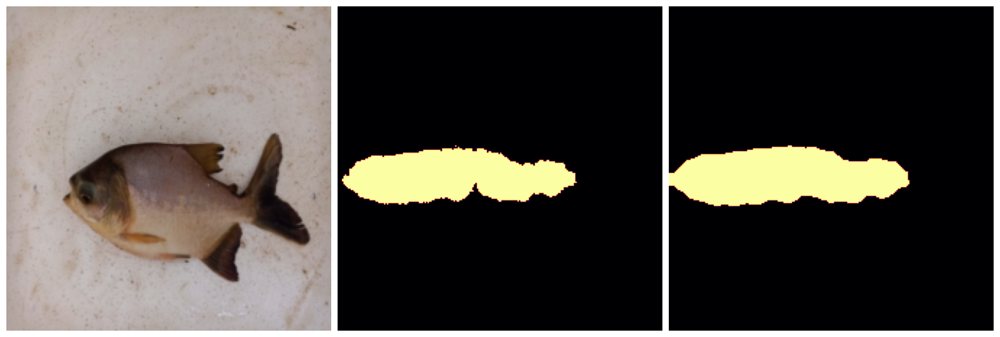

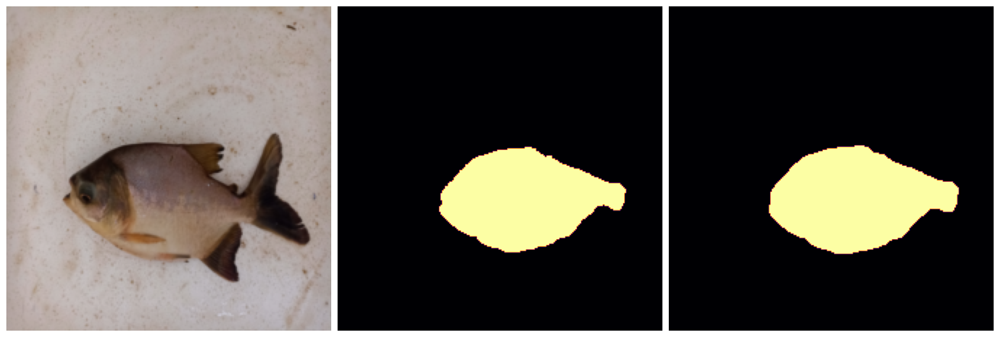

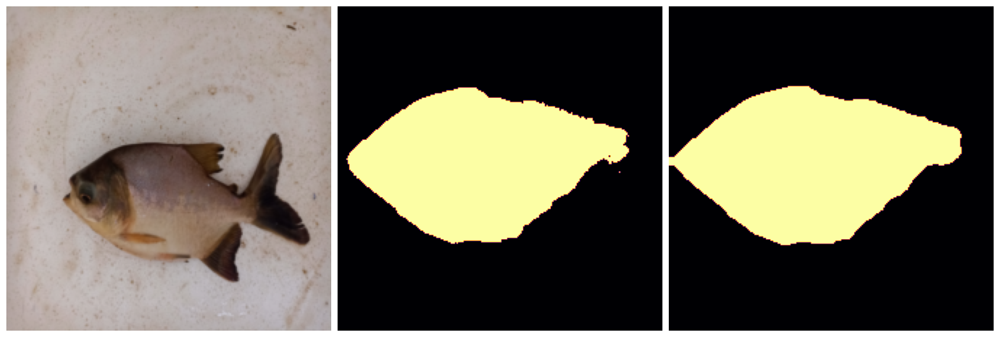

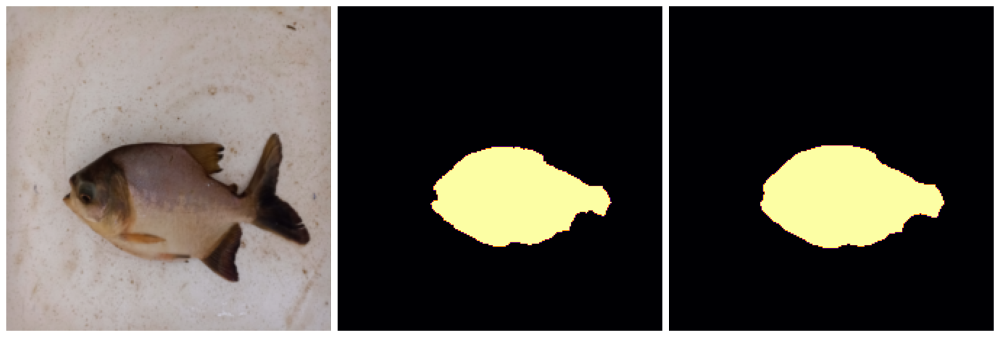

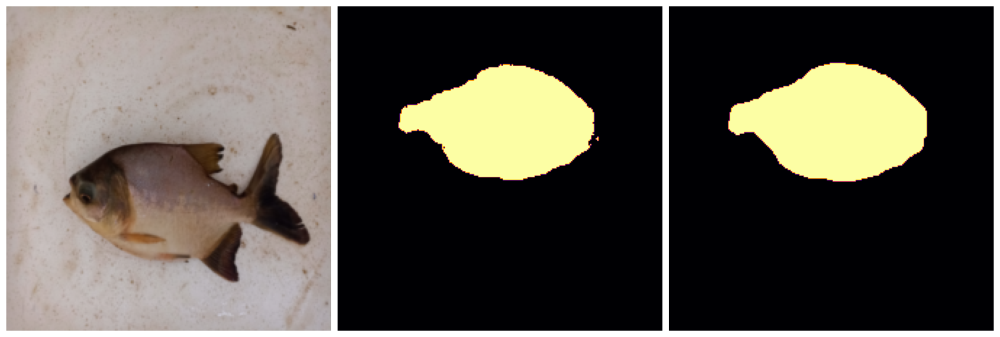

...

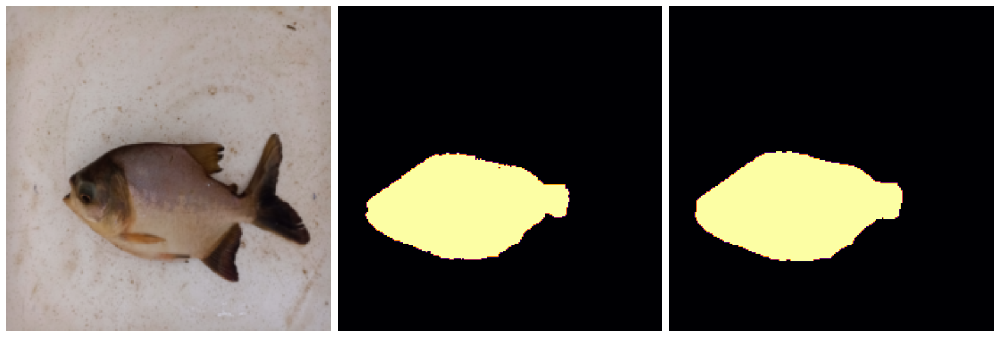

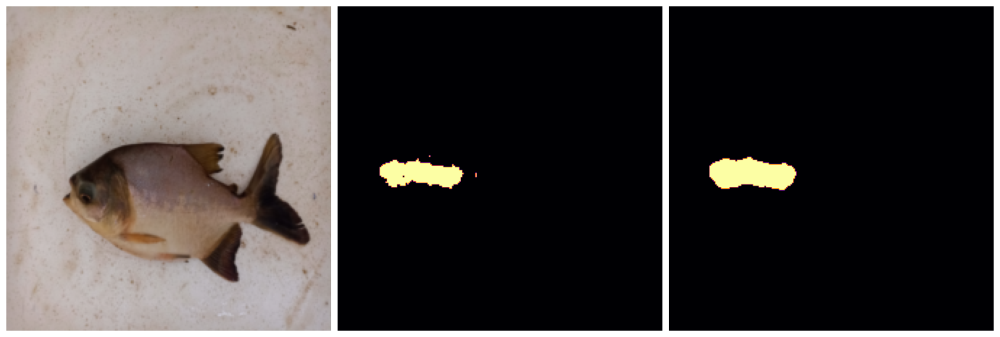

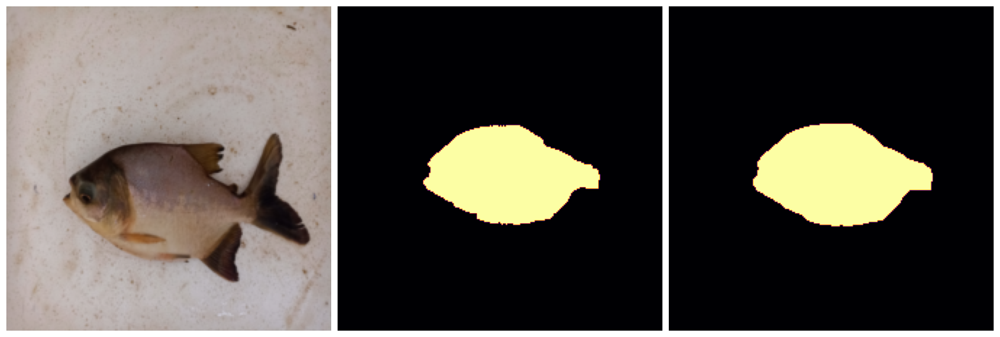

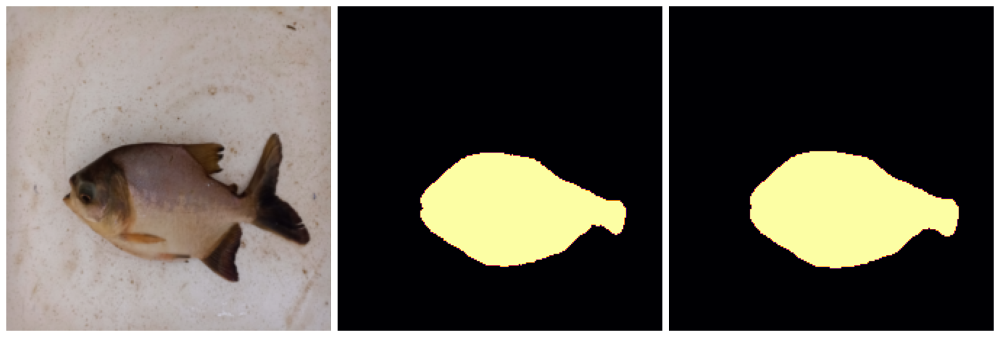

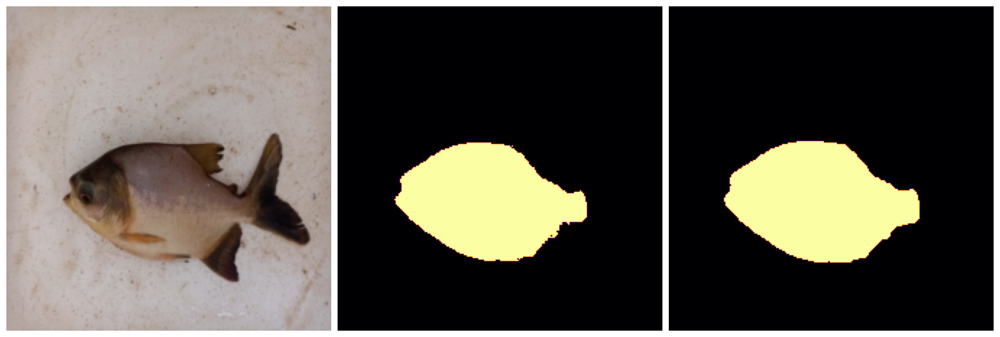

In [128]:
smoothed_masks = []

for index in range(len(y_pred)):
    
    predict_mask = y_pred_thresholded[index][:, :, 0].astype('uint8')
    
    mask_smoothed = smoothing_mask(predict_mask)
    
    smoothed_masks.append(mask_smoothed)
    
    plot([image, predict_mask, mask_smoothed], (1, 3))
    
smoothed_masks = np.asarray(smoothed_masks)

In [189]:
out = pd.DataFrame()

features = ['area',
             'bbox',
             'bbox_area',
             'centroid', 
             'convex_area', 
             'eccentricity',
             'equivalent_diameter', 
             'euler_number',
             'extent',
             'filled_area',
             'label',
             'major_axis_length',
             'minor_axis_length',
             'moments',
             'moments_central',
             'orientation',
             'perimeter',
             'feret_diameter_max',
             'solidity']
    
for mask in tqdm(smoothed_masks):
    
    try:
        props = pd.DataFrame(regionprops_table(label(mask), properties=features))

        out = pd.concat([out, props], ignore_index=True)
        
    except Exception as e:
        print(e)

100%|███████████████████████████████| 30/30 [00:00<00:00, 145.91it/s]


In [190]:
out.to_csv('features_from_predictions_unet.csv', index=None)